# A. Perkenalan

## Team :
1. Nichoulaus Verdhy P - PYTN-KS011-0
2. Tassyirifiyya - PYTN-KS011-0
3. Isma - PYTN-KS011-0

Python for Data Science - Studi Independen - Kampus Merdeka

## Latar Belakang

dataset rideshare adalah sebuah kumpulan data yang berisi informasi tentang perjalanan taksi atau kendaraan dikota new york Amerika serikat, setiap baris data berisi informasi perjalanan, seperti lokasi awal dan akhir, merek dari taksi atau kendaraan, waktu perjalanan, serta informasi lainnya. 

dalam final project kali ini kami memakai dataset rideshare_kaggle.csv (Uber vs Lyft) yang telah disediakan oleh kode.id, dataset ini berisi kumpulan banyak informasi dari kendaraan tersebut,seperti informasi merek dari kendaraan tersebut, mempunyai masing masing informasi mengenai jarak yang di tempuh oleh kendaraan, dan informasi di dalamnya juga bisa di olah datanya sebagai informasi data perbandingan antara uber dengan lyft.



## Objektif

List Final Project 1 yang harus di capai adalah :

1. Mampu memahami konsep regression dengan Linear Regression

2. Mampu mempersiapkan data untuk digunakan dalam model Linear Regression

3. Mampu mengimplementasikan Linear Regression untuk membuat prediksi

# B. Import Pustaka

In [1]:
# import library preprocessing dan visualisasi
import numpy as np
from numpy import mean
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

# Import library modelling
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn import metrics


#buat peta
import folium
from folium.plugins import FastMarkerCluster

#mengatur display biar maximal
pd.options.display.max_rows = None
pd.options.display.max_columns = None

import warnings
warnings.filterwarnings("ignore")

print('success!!')

success!!


# C. Data Loading

In [2]:
df = pd.read_csv('rideshare_kaggle.csv')
pd.set_option('display.max.columns',60)

In [ ]:
df

In [3]:
#checing total row,columns
df.shape

(693071, 57)

In [4]:
#checking values/name of columns
df.columns.values

array(['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone',
       'source', 'destination', 'cab_type', 'product_id', 'name', 'price',
       'distance', 'surge_multiplier', 'latitude', 'longitude',
       'temperature', 'apparentTemperature', 'short_summary',
       'long_summary', 'precipIntensity', 'precipProbability', 'humidity',
       'windSpeed', 'windGust', 'windGustTime', 'visibility',
       'temperatureHigh', 'temperatureHighTime', 'temperatureLow',
       'temperatureLowTime', 'apparentTemperatureHigh',
       'apparentTemperatureHighTime', 'apparentTemperatureLow',
       'apparentTemperatureLowTime', 'icon', 'dewPoint', 'pressure',
       'windBearing', 'cloudCover', 'uvIndex', 'visibility.1', 'ozone',
       'sunriseTime', 'sunsetTime', 'moonPhase', 'precipIntensityMax',
       'uvIndexTime', 'temperatureMin', 'temperatureMinTime',
       'temperatureMax', 'temperatureMaxTime', 'apparentTemperatureMin',
       'apparentTemperatureMinTime', 'apparentTemperat

In [5]:
#showing statistic of dataset
df.describe()

,timestamp,hour,day,month,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,dewPoint,pressure,windBearing,cloudCover,uvIndex,visibility.1,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.930710e+05,693071.000000,693071.000000,693071.000000,637976.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,6.930710e+05,693071.000000,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,6.930710e+05,6.930710e+05,693071.000000,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05
mean,1.544046e+09,11.619137,17.794365,11.586684,16.545125,2.189430,1.013870,42.338172,-71.066151,39.584388,35.881222,0.008922,0.146076,0.741119,6.186253,8.469860,1.544049e+09,8.467970,45.040982,1.544050e+09,34.150736,1.544102e+09,41.614054,1.544050e+09,30.139824,1.544099e+09,31.656256,1010.094766,220.055853,0.686502,0.248908,8.467970,313.513635,1.544027e+09,1.544060e+09,0.579066,0.037374,1.544044e+09,33.457774,1.544042e+09,45.261313,1.544047e+09,29.731002,1.544048e+09,41.997343,1.544048e+09
std,6.891925e+05,6.948114,9.982286,0.492429,9.324359,1.138937,0.091641,0.047840,0.020302,6.726084,7.918707,0.026901,0.328938,0.138595,3.148223,5.289179,6.928244e+05,2.602888,5.996541,6.937921e+05,6.383163,6.922923e+05,7.666138,6.941699e+05,8.057468,6.927378e+05,9.142355,13.472899,99.102736,0.358534,0.474097,2.602888,27.953061,6.911393e+05,6.906634e+05,0.244705,0.055214,6.912028e+05,6.467224,6.901954e+05,5.645046,6.901353e+05,7.110494,6.871862e+05,6.936841,6.910777e+05
min,1.543204e+09,0.000000,1.000000,11.000000,2.500000,0.020000,1.000000,42.214800,-71.105400,18.910000,12.130000,0.000000,0.000000,0.380000,0.450000,0.800000,1.543151e+09,0.717000,32.680000,1.543154e+09,17.850000,1.543234e+09,22.620000,1.543187e+09,11.810000,1.543234e+09,4.390000,988.090000,2.000000,0.000000,0.000000,0.717000,269.400000,1.543147e+09,1.543181e+09,0.090000,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,9.000000,1.280000,1.000000,42.350300,-71.081000,36.450000,31.910000,0.000000,0.000000,0.640000,3.410000,4.060000,1.543432e+09,8.432000,42.570000,1.543439e+09,30.170000,1.543489e+09,36.570000,1.543439e+09,27.700000,1.543478e+09,27.490000,999.820000,124.000000,0.370000,0.000000,8.432000,290.900000,1.543406e+09,1.543440e+09,0.300000,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,13.500000,2.160000,1.000000,42.351900,-71.063100,40.490000,35.900000,0.000000,0.000000,0.710000,5.910000,7.550000,1.543756e+09,9.880000,44.680000,1.543788e+09,34.180000,1.543817e+09,40.950000,1.543788e+09,30.030000,1.543817e+09,30.690000,1009.250000,258.000000,0.820000,0.000000,9.880000,307.400000,1.543752e+09,1.543785e+09,0.680000,0.000400,1.543770e+09,34.240000,1.543727e+09,44.680000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,22.500000,2.920000,1.000000,42.364700,-71.054200,43.580000,40.080000,0.000000,0.000000,0.880000,8.410000,11.740000,1.544846e+09,9.996000,46.910000,1.544814e+09,38.730000,1.544836e+09,44.120000,1.544818e+09

In [6]:
#checking info of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

Dataset ini 57 kolom bertipe data integer, float, dan object. Masing- masing kolom mempunyai arti tersendiri yaitu:

1. id = 
2. 
3. 

dst

# D. Data Cleaning

Setelah dilakukan df.info() dapat dilihat bahwa terdapat 2 kolom yang memiliki nama yang mirip yaitu visibility dan visibility.1

In [7]:
df[['visibility','visibility.1']].head()

,visibility,visibility.1
0,10.000,10.000
1,4.786,4.786
2,10.000,10.000
3,10.000,10.000
4,10.000,10.000


dapat dilihat bahwa data yang dimiliki oleh kedua kolom sama, maka sebaiknya salah satu kolom dihapus.

In [8]:
df = df.drop(['visibility.1'],axis=1)

In [9]:
#checking null
df.isnull().sum()

id                                 0
timestamp                          0
hour                               0
day                                0
month                              0
datetime                           0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
v

**Total data = 693.071 data**

**Total missing value = 55.095**

Missing value berada pada kolom **Price**. Total missing value merupakan 7,95% dari total data aslinya. Sehingga, baris yang memiliki missing value dihapuskan.

In [10]:
#delete missing value
df.dropna(axis=0,inplace=True)

df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,Mostly Cloudy,Rain throughout the day.,0.0000,0.0,0.68,8.66,9.17,1545015600,10.000,43.68,1544968800,34.19,1545048000,37.95,1544968800,27.39,1545044400,partly-cloudy-night,32.70,1021.98,57,0.72,0,303.8,1544962084,1544994864,0.30,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,Rain,"Rain until morning, starting again in the eve...",0.1299,1.0,0.94,11.98,11.98,1543291200,4.786,47.30,1543251600,42.10,1543298400,43.92,1543251600,36.20,1543291200,rain,41.83,1003.97,90,1.00,0,291.1,1543232969,1543266992,0.64,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,Clear,Light rain in the morning.,0.0000,0.0,0.75,7.33,7.33,1543334400,10.000,47.55,1543320000,33.10,1543402800,44.12,1543320000,29.11,1543392000,clear-night,31.10,992.28,240,0.03,0,315.7,1543319437,1543353364,0.68,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,Clear,Partly cloudy throughout the day.,0.0000,0.0,0.73,5.28,5.28,1543514400,10.000,45.03,1543510800,28.90,1543579200,38.53,1543510800,26.20,1543575600,clear-night,26.64,1013.73,310,0.00,0,291.1,1543492370,1543526114,0.75,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,Partly Cloudy,Mostly cloudy throughout the day.,0.0000,0.0,0.70,9.14,9.14,1543446000,10.000,42.18,1543420800,36.71,1543478400,35.75,1543420800,30.29,1543460400,partly-cloudy-night,28.61,998.36,303,0.44,0,347.7,1543405904,1543439738,0.72,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [13]:
#checking row,columns
df.shape

(637976, 56)

In [14]:
df.cab_type.value_counts()

Uber    330568
Lyft    307408
Name: cab_type, dtype: int64

In [11]:
df.month.value_counts()

12    374205
11    263771
Name: month, dtype: int64

# E. Explorasi Data

## Membuat fungsi untuk analisi plot line 1 kolom

In [15]:
import matplotlib.pyplot as plt
import numpy as np

def plot_line(groupby_column):
    df1 = df.groupby(groupby_column).size().reset_index(name="counts")  # Mengelompokkan data dan menghitung jumlah data dalam setiap grup
    x = df1[groupby_column]  # Menyimpan data kolom groupby_column ke dalam variabel x
    y = df1["counts"]  # Menyimpan data kolom counts ke dalam variabel y
    num_colors = len(df1)  # Menghitung jumlah warna yang dibutuhkan untuk plot
    colormap = plt.cm.get_cmap('tab20', num_colors)  # Mengambil colormap dengan jumlah warna yang sesuai
    fig, ax = plt.subplots(figsize=(25, 10))  # Membuat objek plot dan sumbu, serta mengatur ukuran figure menjadi 8x6 inches
    for i in range(num_colors): #perulangan untuk warna
        ax.plot(x, y, marker='o', color=colormap(i))  # Setiap line plot diberi warna yang berbeda sesuai dengan colormap
    ax.set_xlabel(groupby_column)  # Label sumbu x
    ax.set_ylabel('Jumlah')  # Label sumbu y
    ax.set_title(f'Line Plot untuk {groupby_column}')  # Judul plot
    print(df1)
    plt.show()  # Menampilkan plot

## Membuat fungsi untuk analisi plot bar 1 kolom

In [16]:
def plot_bar(groupby_column):
    df1 = df.groupby(groupby_column).size().reset_index(name="counts")  # Mengelompokkan data dan menghitung jumlah data dalam setiap grup
    x = df1[groupby_column]  # Menyimpan data kolom groupby_column ke dalam variabel x
    y = df1["counts"]  # Menyimpan data kolom counts ke dalam variabel y
    num_colors = len(df1)  # Menghitung jumlah warna yang dibutuhkan untuk plot
    colormap = plt.cm.get_cmap('tab20', num_colors)  # Mengambil colormap dengan jumlah warna yang sesuai
    fig, ax = plt.subplots(figsize=(20, 10))  # Membuat objek plot dan sumbu, serta mengatur ukuran figure menjadi 10x6 inches
    bars = ax.bar(x, y, color=colormap(np.arange(num_colors)))  # Membuat plot bar

    # Menambahkan legend pada penunjuk di sebelah kanan
    ax.legend(bars, df1[groupby_column], title=groupby_column, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    ax.set_xlabel(groupby_column)  # Label sumbu x
    ax.set_ylabel('Jumlah')  # Label sumbu y
    ax.set_title(f'Bar Plot untuk {groupby_column}')  # Judul plot
    print(df1)
    plt.show()  # Menampilkan plot

## Membuat Lineplot dengan groupby 2 kolom

In [17]:
import matplotlib.pyplot as plt
import numpy as np


import matplotlib.pyplot as plt
import numpy as np

# Membuat fungsi plt_line_double dengan 2 argumen
def plt_line_double(groupby1, groupby2):
    # Melakukan groupby pada DataFrame df berdasarkan kolom groupby1 dan groupby2, dan menghitung jumlah
    df2 = df.groupby(by=[groupby1, groupby2]).size().reset_index(name="counts")
    
    # Mengambil nilai x dan y dari DataFrame df2
    x = df2[groupby1]
    y = df2["counts"]
    
    # Mengambil nilai warna dari DataFrame df2
    colors = df2[groupby2]
    
    # Membuat objek figure dan axis pada plot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Mengiterasi warna yang ada pada DataFrame df2
    for cab_type in df2[groupby2].unique():
        # Membuat plot garis dengan marker berbentuk 'o' untuk setiap warna yang berbeda
        ax.plot(x[colors == cab_type], y[colors == cab_type], marker='o', label=cab_type)

    # Menyertakan label pada sumbu x dan y, serta judul plot
    ax.set_xlabel(groupby1)
    ax.set_ylabel('Counts')
    ax.set_title('Line Chart')
    
    # Menyertakan legenda pada plot
    ax.legend()
    
    # Menampilkan plot
    plt.show()

## ANALISIS BERDASARKAN WAKTU

    hour  counts
0      0   29872
1      1   26310
2      2   26323
3      3   25530
4      4   26125
5      5   22995
6      6   25147
7      7   22930
8      8   22337
9      9   26673
10    10   27918
11    11   27946
12    12   28017
13    13   27977
14    14   27976
15    15   27868
16    16   27972
17    17   28075
18    18   27958
19    19   25410
20    20   24620
21    21   25549
22    22   27093
23    23   29355


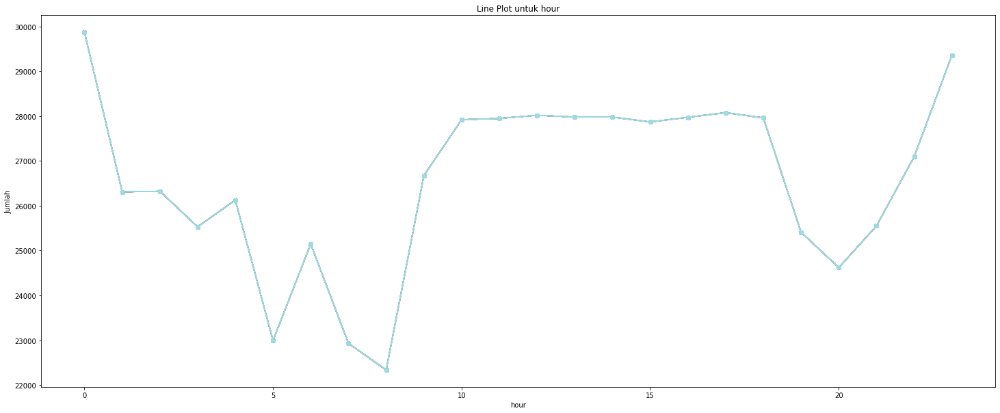

In [18]:
plot_line('hour')

    hour  counts
0      0   29872
1      1   26310
2      2   26323
3      3   25530
4      4   26125
5      5   22995
6      6   25147
7      7   22930
8      8   22337
9      9   26673
10    10   27918
11    11   27946
12    12   28017
13    13   27977
14    14   27976
15    15   27868
16    16   27972
17    17   28075
18    18   27958
19    19   25410
20    20   24620
21    21   25549
22    22   27093
23    23   29355


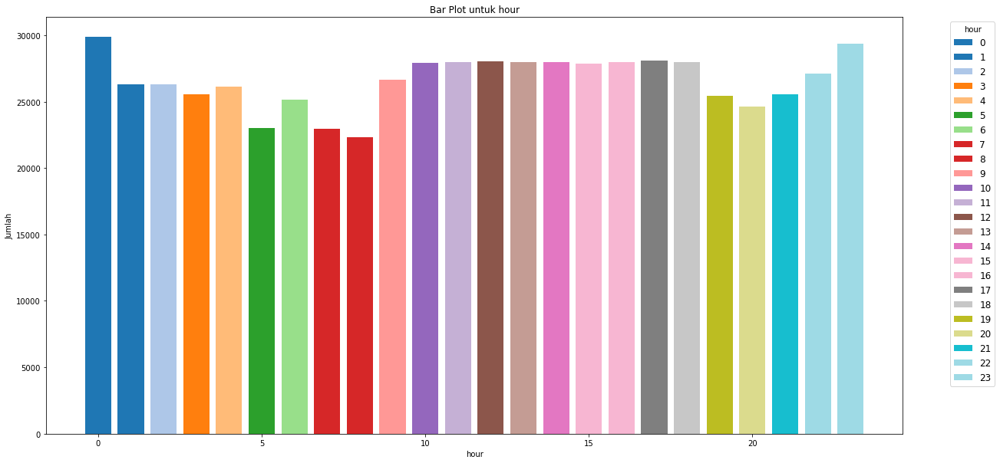

In [19]:
plot_bar('hour')

    day  counts
0     1   41680
1     2   41298
2     3   41323
3     4   11627
4     9    1529
5    10    2534
6    13   35496
7    14   41344
8    15   41332
9    16   41359
10   17   41354
11   18   33329
12   26   29028
13   27   70135
14   28   67842
15   29   55222
16   30   41544


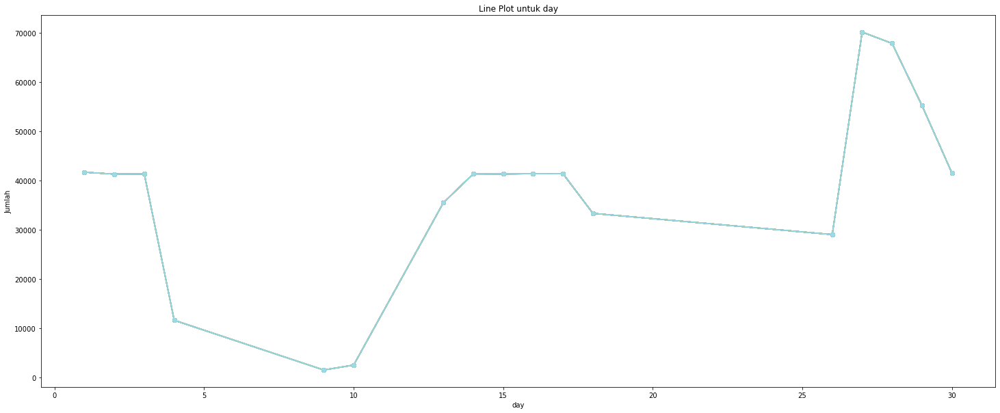

In [20]:
plot_line('day')

    day  counts
0     1   41680
1     2   41298
2     3   41323
3     4   11627
4     9    1529
5    10    2534
6    13   35496
7    14   41344
8    15   41332
9    16   41359
10   17   41354
11   18   33329
12   26   29028
13   27   70135
14   28   67842
15   29   55222
16   30   41544


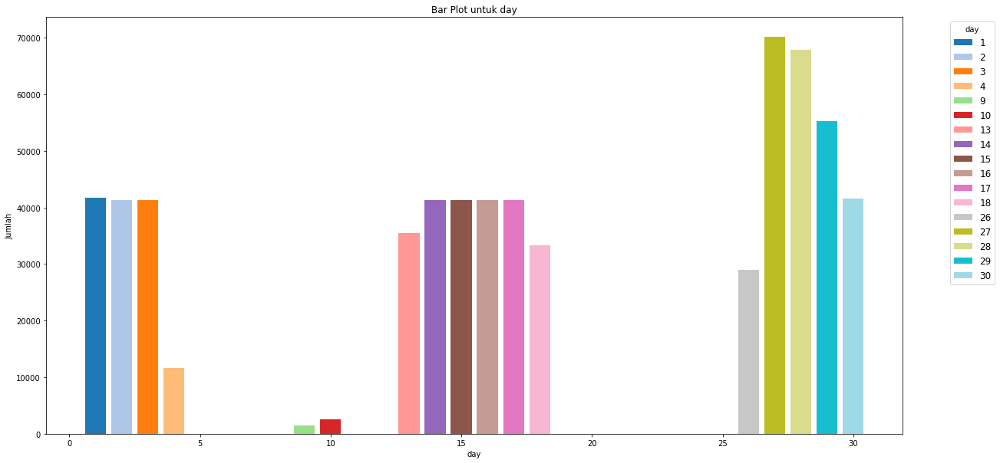

In [21]:
plot_bar("day")

   month  counts
0     11  263771
1     12  374205


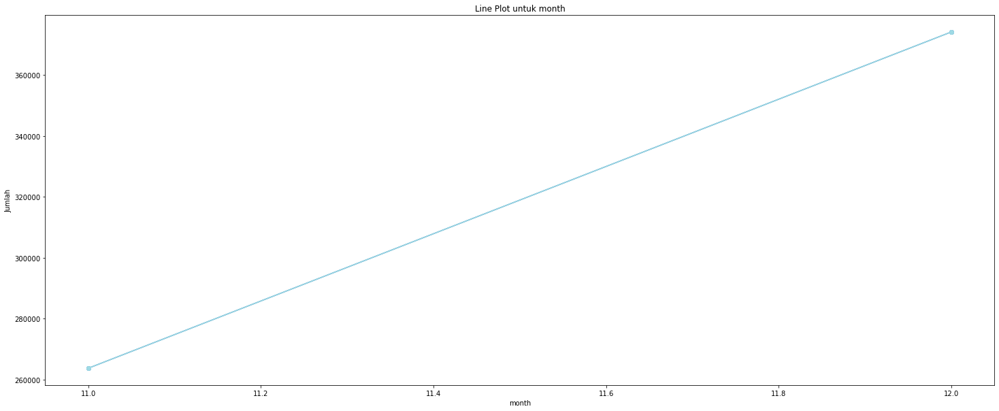

In [22]:
plot_line('month')

   month  counts
0     11  263771
1     12  374205


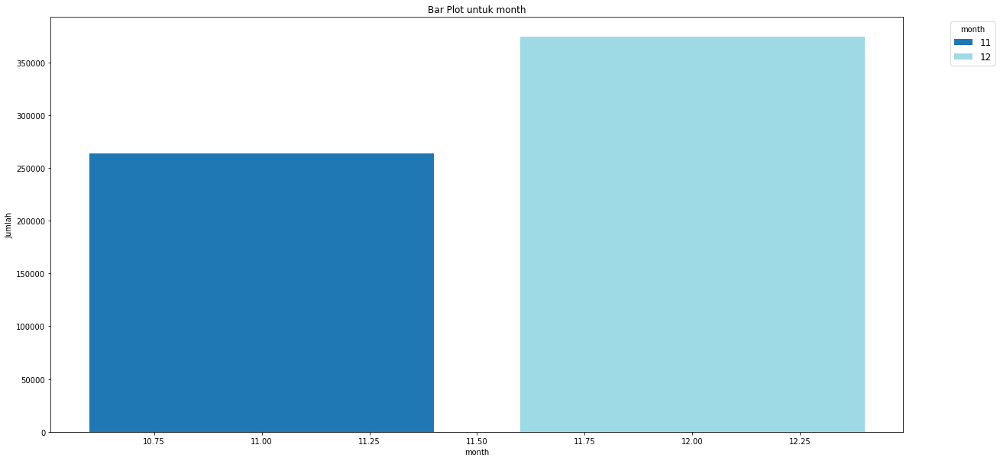

In [23]:
plot_bar('month')

##  ANALISI BERDSARKAN SOURCE DESTINASI

                     source  counts
0                  Back Bay   53201
1               Beacon Hill   52841
2         Boston University   53172
3                    Fenway   53166
4        Financial District   54197
5          Haymarket Square   53147
6                 North End   53171
7             North Station   52576
8   Northeastern University   53164
9             South Station   53160
10         Theatre District   53201
11                 West End   52980


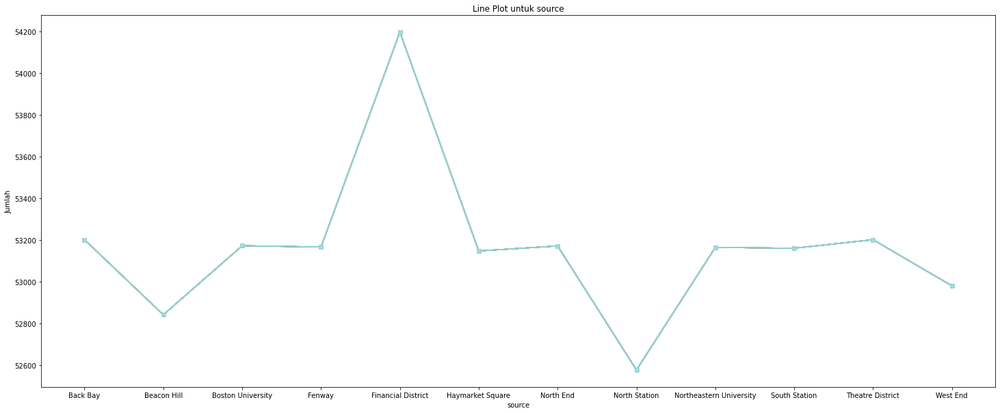

In [24]:
plot_line("source")

                     source  counts
0                  Back Bay   53201
1               Beacon Hill   52841
2         Boston University   53172
3                    Fenway   53166
4        Financial District   54197
5          Haymarket Square   53147
6                 North End   53171
7             North Station   52576
8   Northeastern University   53164
9             South Station   53160
10         Theatre District   53201
11                 West End   52980


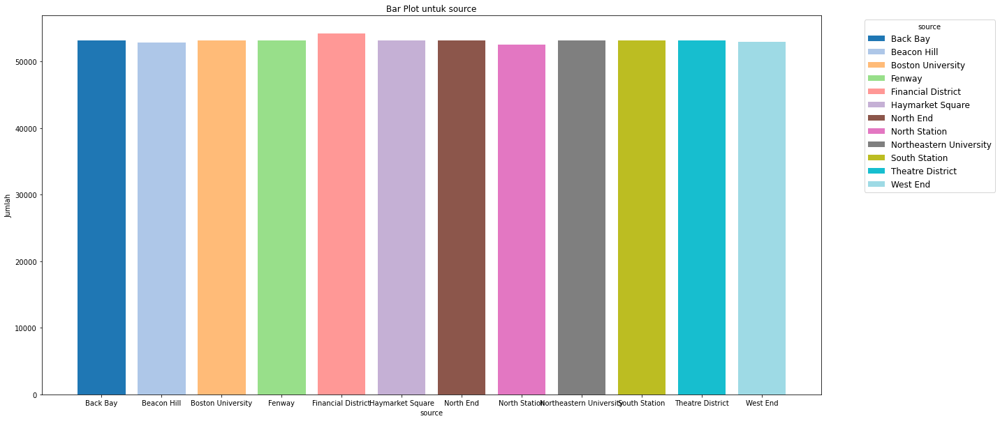

In [25]:
plot_bar("source")

                destination  counts
0                  Back Bay   53190
1               Beacon Hill   52840
2         Boston University   53171
3                    Fenway   53166
4        Financial District   54192
5          Haymarket Square   53171
6                 North End   53164
7             North Station   52577
8   Northeastern University   53165
9             South Station   53159
10         Theatre District   53189
11                 West End   52992


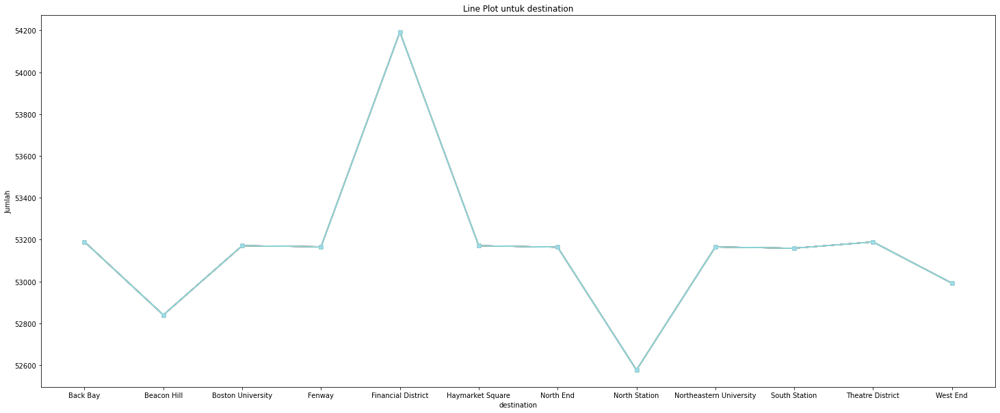

In [26]:
plot_line('destination')

                destination  counts
0                  Back Bay   53190
1               Beacon Hill   52840
2         Boston University   53171
3                    Fenway   53166
4        Financial District   54192
5          Haymarket Square   53171
6                 North End   53164
7             North Station   52577
8   Northeastern University   53165
9             South Station   53159
10         Theatre District   53189
11                 West End   52992


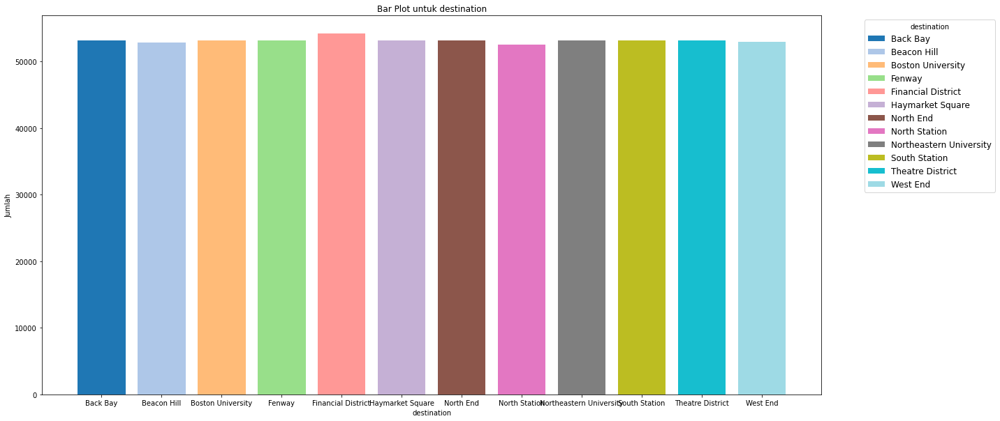

In [27]:
plot_bar('destination')

  cab_type  counts
0     Lyft  307408
1     Uber  330568


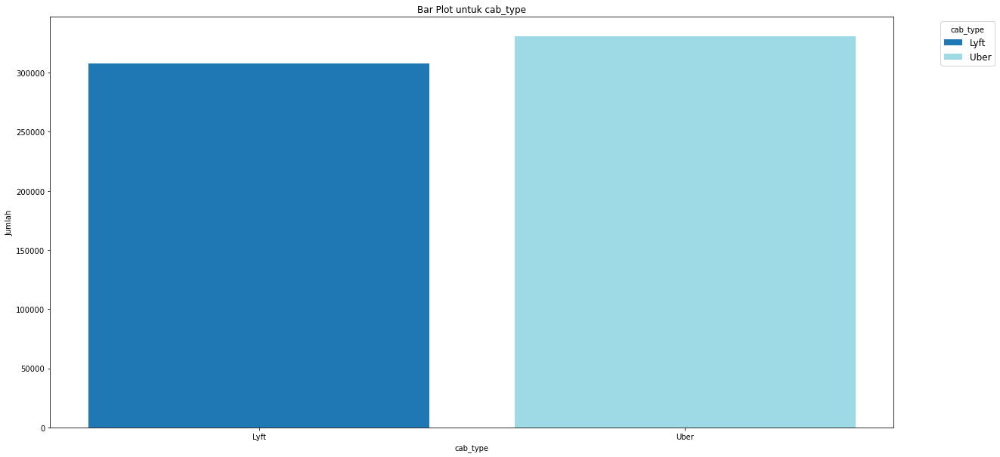

In [28]:
plot_bar("cab_type")

  cab_type  counts
0     Lyft  307408
1     Uber  330568


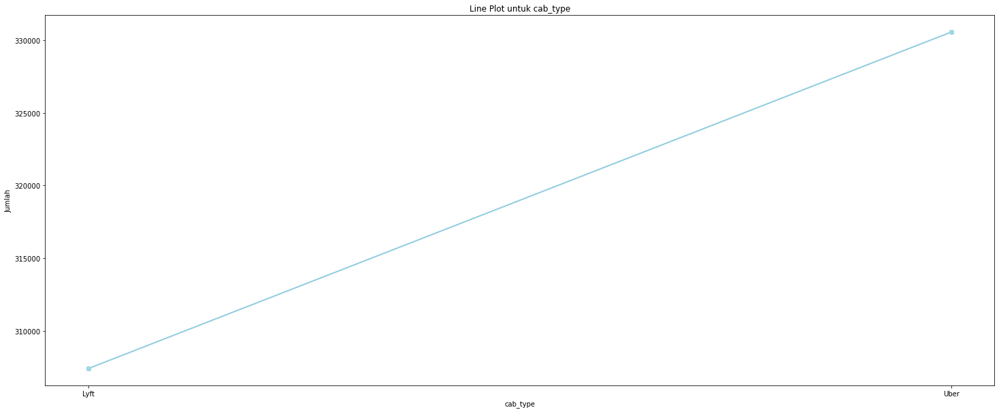

In [29]:
plot_line("cab_type")

## Analisis dengan cab_type

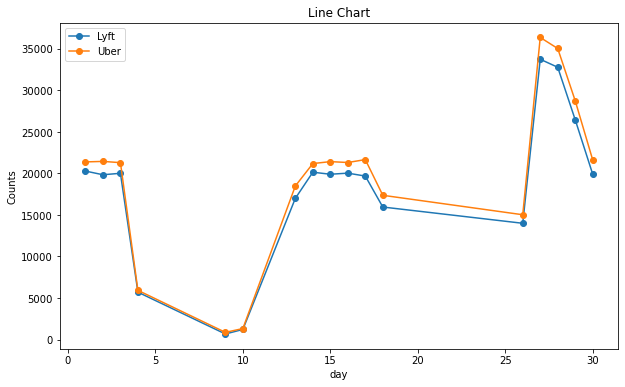

In [30]:
plt_line_double("day","cab_type")

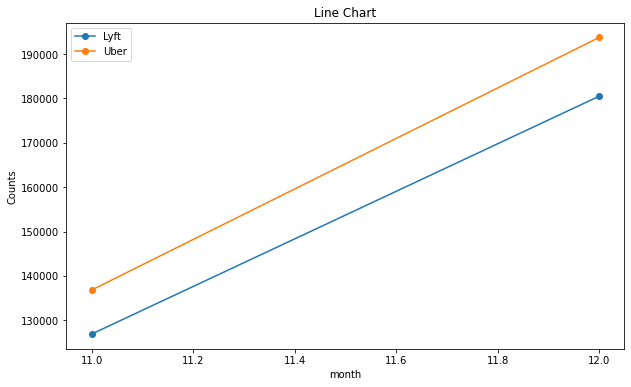

In [31]:
plt_line_double("month","cab_type")

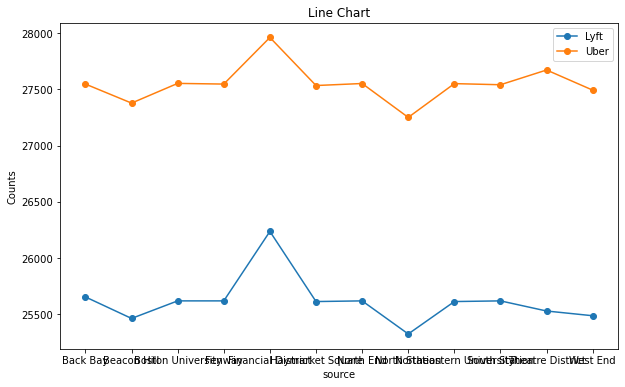

In [32]:
plt_line_double("source","cab_type")

## ANALISIS BERDASARKAN HARGA

In [33]:
# Melakukan groupby dan menghitung rata-rata price
df.groupby(by=["source","destination"]).price.agg(["mean"])

mean
source                  destination                       
Back Bay                Boston University        14.039392
                        Fenway                   13.658752
                        Haymarket Square         17.987384
                        North End                19.473019
                        Northeastern University  13.151040
                        South Station            17.700711
Beacon Hill             Boston University        16.376737
                        Fenway                   16.158840
                        Haymarket Square         13.799137
                        North End                15.270942
                        Northeastern University  16.471792
                        South Station            15.950661
Boston University       Back Bay                 13.992801
                        Beacon Hill              17.315535
                        Financial District       24.146085
                        North Station            20.185338
                        Theatre District         18.689557
                        West End                 18.611766
Fenway                  Back Bay                 13.802155
                        Beacon Hill              16.796674
                        Financial District       23.438818
                        North Station            19.701839
                        Theatre District         18.232722
                        West End                 18.161806
Financial District      Boston University        25.498434
                        Fenway                   23.404850
                        Haymarket Square         13.188209
                        North End                13.179635
                        Northeastern University  21.918584
                        South Station            12.349066
Haymarket Square        Back Bay                 16.860489
                        Beacon Hill              13.338559
                        Financial District       12.731618
                        North Station            12.332545
                        Theatre District         13.677272
                        West End                 12.529855
North End               Back Bay                 19.550935
                        Beacon Hill              15.982630
                        Financial District       13.417597
                        North Station            12.824092
                        Theatre District         15.169406
                        West End                 13.494873
North Station           Boston University        18.931558
                        Fenway                   18.547603
                        Haymarket Square         12.571791
                        North End                13.106641
                        Northeastern University  19.537848
                        South Station            15.374198
Northeastern University Back Bay                 13.698923
                        Beacon Hill              16.842433
                        Financial District       22.582094
                        North Station            19.910939
                        Theatre District         16.144805
                        West End                 18.204155
South Station           Back Bay                 19.103822
                        Beacon Hill              17.276304
                        Financial District       12.436910
                        North Station            15.746736
                        Theatre District         13.952579
                        West End                 15.881172
Theatre District        Boston University        20.360662
                        Fenway                   19.069278
                        Haymarket Square         15.204973
                        North End                15.159646
                        Northeastern University  16.910751
                        South Station            12.888926
West End                Boston University 

In [34]:
#mencari data yang mempunyai nilai tertinggi
print('Harga tertinggi :',df.price.max())
df[df['price']==df.price.max()]

Harga tertinggi : 97.5


,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
597071,ba1593a1-e4fd-4c7a-a011-e2d4fccbf081,1.543714e+09,1,2,12,2018-12-02 01:28:02,America/New_York,Financial District,Fenway,Lyft,lyft_luxsuv,Lux Black XL,97.5,4.43,2.0,42.3503,-71.081,35.52,35.52,Clear,Light rain in the morning and overnight.,0.0,0.0,0.82,1.85,2.37,1543672800,9.846,44.65,1543690800,34.88,1543712400,43.98,1543690800,35.53,1543712400,clear-night,30.46,1023.52,146,0.12,0,274.6,1543665335,1543698860,0.82,0.0,1543683600,31.57,1543665600,44.65,1543690800,28.1,1543658400,43.98,1543690800


In [35]:
#melakukan pengecekan destinasi
df[df['price']==df.price.max()][['latitude','longitude']]

,latitude,longitude
597071,42.3503,-71.081


In [36]:
# Membuat objek peta folium yang terpusat pada lokasi yang ditentukan, dengan tingkat zoom awal 10
map1 = folium.Map(location=(42.3503,-71.081), zoom_start=10)

# Menambahkan marker pada lokasi Fenway dengan menggunakan koordinat latitude dan longitude yang ditentukan
folium.Marker(location=(42.3503,-71.081)).add_to(map1)

# Menambahkan marker pada lokasi Financial District dengan menggunakan koordinat latitude dan longitude yang ditentukan
folium.Marker(location=(42.3378,-71.066)).add_to(map1)

# Menampilkan objek peta folium
display(map1)

In [37]:
df_group = df.groupby(by=["source","destination"]).price.agg(["mean"]).reset_index()
df_group[(df_group['source']=='Financial District')& (df_group['destination']=='Fenway')]

,source,destination,mean
25,Financial District,Fenway,23.40485


In [38]:
df = df.loc[df['price']!=df.price.max()]

In [39]:
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,Mostly Cloudy,Rain throughout the day.,0.0000,0.0,0.68,8.66,9.17,1545015600,10.000,43.68,1544968800,34.19,1545048000,37.95,1544968800,27.39,1545044400,partly-cloudy-night,32.70,1021.98,57,0.72,0,303.8,1544962084,1544994864,0.30,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,Rain,"Rain until morning, starting again in the eve...",0.1299,1.0,0.94,11.98,11.98,1543291200,4.786,47.30,1543251600,42.10,1543298400,43.92,1543251600,36.20,1543291200,rain,41.83,1003.97,90,1.00,0,291.1,1543232969,1543266992,0.64,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,Clear,Light rain in the morning.,0.0000,0.0,0.75,7.33,7.33,1543334400,10.000,47.55,1543320000,33.10,1543402800,44.12,1543320000,29.11,1543392000,clear-night,31.10,992.28,240,0.03,0,315.7,1543319437,1543353364,0.68,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,Clear,Partly cloudy throughout the day.,0.0000,0.0,0.73,5.28,5.28,1543514400,10.000,45.03,1543510800,28.90,1543579200,38.53,1543510800,26.20,1543575600,clear-night,26.64,1013.73,310,0.00,0,291.1,1543492370,1543526114,0.75,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,Partly Cloudy,Mostly cloudy throughout the day.,0.0000,0.0,0.70,9.14,9.14,1543446000,10.000,42.18,1543420800,36.71,1543478400,35.75,1543420800,30.29,1543460400,partly-cloudy-night,28.61,998.36,303,0.44,0,347.7,1543405904,1543439738,0.72,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


# F. Data Preprocessing

In [40]:
df_modeling = df.drop(['id','timestamp','datetime','long_summary','apparentTemperatureHighTime','apparentTemperatureLowTime',
                  'apparentTemperatureLowTime','windGustTime','sunriseTime','sunsetTime','uvIndexTime','temperatureMinTime',
                 'temperatureMaxTime','apparentTemperatureMinTime','temperatureLowTime','apparentTemperatureMaxTime'],axis=1)

In [41]:
df_modeling.shape

(637975, 41)

## Mengecek korelasi temperatrue dengan hgarga

In [42]:
korelasi_colom_1= ['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax','price']

<AxesSubplot:>

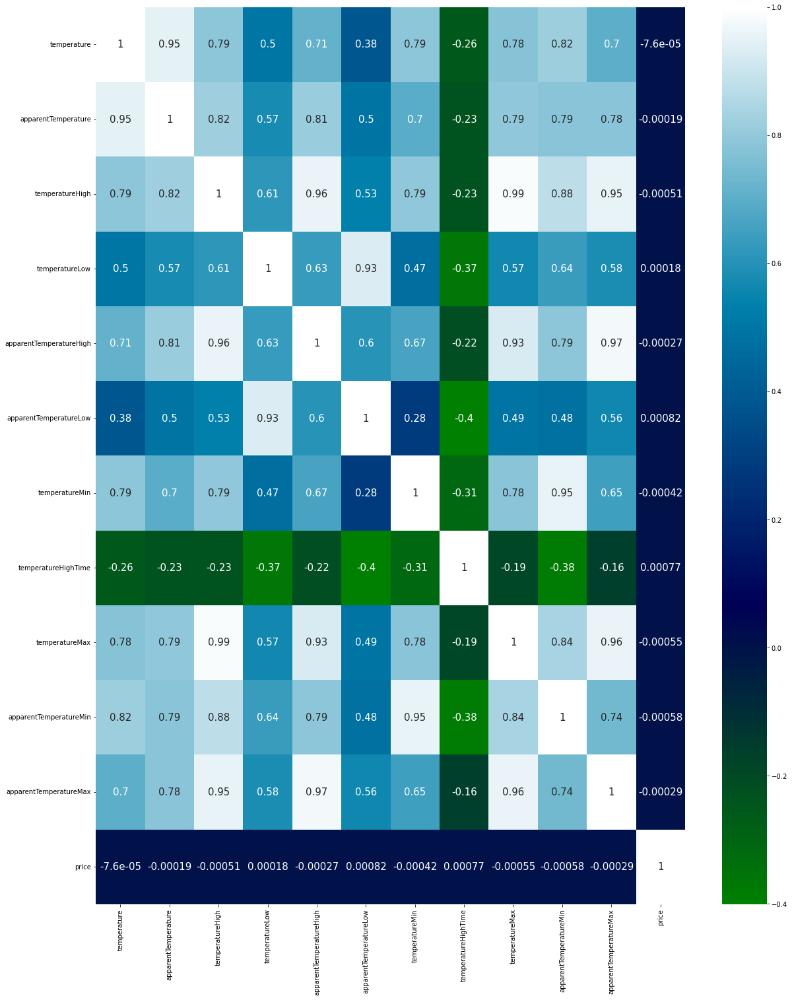

In [43]:
df_temp = df_modeling[korelasi_colom_1]
plt.figure(figsize=(20,25))
sns.heatmap(df_temp.corr(),annot=True, cmap="ocean", annot_kws={'fontsize': 15})

In [ ]:
df_modeling = df_modeling.drop(['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax'],axis=1)
df_modeling.shape

## Mengecek korelasi klimitasi dengan harga

In [44]:
korelasi_colom_2 = ['precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax','price']
df_temp_2 = df_modeling[korelasi_colom_2]
df_temp_2.head()

,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,price
0,0.0000,0.0,0.68,8.66,9.17,10.000,32.70,1021.98,57,0.72,0,303.8,0.30,0.1276,5.0
1,0.1299,1.0,0.94,11.98,11.98,4.786,41.83,1003.97,90,1.00,0,291.1,0.64,0.1300,11.0
2,0.0000,0.0,0.75,7.33,7.33,10.000,31.10,992.28,240,0.03,0,315.7,0.68,0.1064,7.0
3,0.0000,0.0,0.73,5.28,5.28,10.000,26.64,1013.73,310,0.00,0,291.1,0.75,0.0000,26.0
4,0.0000,0.0,0.70,9.14,9.14,10.000,28.61,998.36,303,0.44,0,347.7,0.72,0.0001,9.0


<AxesSubplot:>

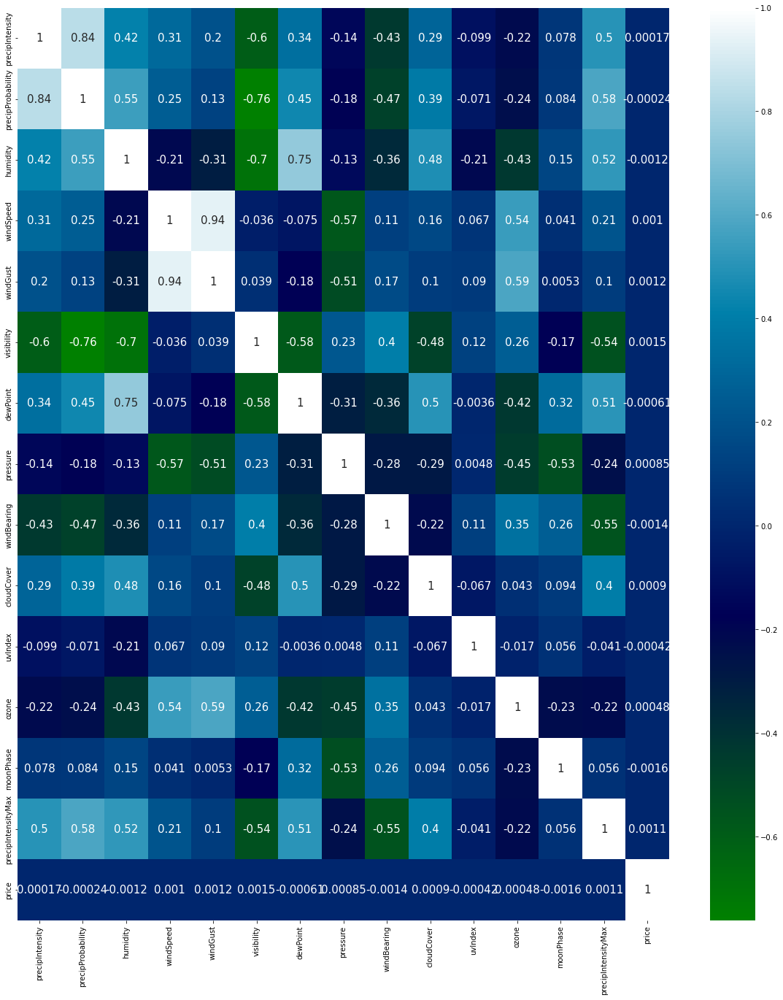

In [45]:
plt.figure(figsize=(20,23))
sns.heatmap(df_temp_2.corr(),annot=True,cmap="ocean", annot_kws={'fontsize': 15})

In [ ]:
df_modeling = df_modeling.drop(['precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax'],axis=1)
df_modeling.shape

## Melihat nilai dari masing masing kolom

In [46]:
nilai_kategori_kolom = df_modeling.select_dtypes(include=['object','category']).columns.tolist()
for column in df_modeling[nilai_kategori_kolom]:
    print(f'{column} : {df_modeling[column].unique()}')
    print()

timezone : ['America/New_York']

source : ['Haymarket Square' 'Back Bay' 'North End' 'North Station' 'Beacon Hill'
 'Boston University' 'Fenway' 'South Station' 'Theatre District'
 'West End' 'Financial District' 'Northeastern University']

destination : ['North Station' 'Northeastern University' 'West End' 'Haymarket Square'
 'South Station' 'Fenway' 'Theatre District' 'Beacon Hill' 'Back Bay'
 'North End' 'Financial District' 'Boston University']

cab_type : ['Lyft' 'Uber']

product_id : ['lyft_line' 'lyft_premier' 'lyft' 'lyft_luxsuv' 'lyft_plus' 'lyft_lux'
 '6f72dfc5-27f1-42e8-84db-ccc7a75f6969'
 '6c84fd89-3f11-4782-9b50-97c468b19529'
 '55c66225-fbe7-4fd5-9072-eab1ece5e23e'
 '9a0e7b09-b92b-4c41-9779-2ad22b4d779d'
 '6d318bcc-22a3-4af6-bddd-b409bfce1546'
 '997acbb5-e102-41e1-b155-9df7de0a73f2']

name : ['Shared' 'Lux' 'Lyft' 'Lux Black XL' 'Lyft XL' 'Lux Black' 'UberXL'
 'Black' 'UberX' 'WAV' 'Black SUV' 'UberPool']

short_summary : [' Mostly Cloudy ' ' Rain ' ' Clear ' ' Partly Clou

In [47]:
df_modeling = df_modeling.drop(['timezone','product_id'],axis=1)

In [48]:
df_modeling.shape

(637975, 39)

In [49]:
korelasi_kolom_3 = ['source',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'icon','price']

df_korelasi_kolom_3 = df_modeling[korelasi_kolom_3]
df_korelasi_kolom_3.head()

,source,destination,cab_type,name,short_summary,icon,price
0,Haymarket Square,North Station,Lyft,Shared,Mostly Cloudy,partly-cloudy-night,5.0
1,Haymarket Square,North Station,Lyft,Lux,Rain,rain,11.0
2,Haymarket Square,North Station,Lyft,Lyft,Clear,clear-night,7.0
3,Haymarket Square,North Station,Lyft,Lux Black XL,Clear,clear-night,26.0
4,Haymarket Square,North Station,Lyft,Lyft XL,Partly Cloudy,partly-cloudy-night,9.0


## Encode korelasi kolom 3

In [50]:
from sklearn import preprocessing # Mengimpor modul preprocessing dari library sklearn
le = preprocessing.LabelEncoder() # Membuat objek LabelEncoder() dari modul preprocessing dan menyimpannya dalam variabel le

df_korelasi_kolom_3_encode = df_korelasi_kolom_3.copy() # Membuat salinan dataframe df_korelasi_kolom_3 dan menyimpannya dalam variabel df_korelasi_kolom_3_encode

for col in df_korelasi_kolom_3_encode.select_dtypes(include='O').columns: # Melakukan iterasi pada setiap kolom dalam dataframe df_korelasi_kolom_3_encode yang memiliki tipe data 'O' (objek)
    df_korelasi_kolom_3_encode[col]=le.fit_transform(df_korelasi_kolom_3[col]) # Menggunakan objek LabelEncoder() untuk mengubah nilai-nilai dalam kolom menjadi angka (encoding) dan menyimpan hasilnya dalam kolom yang sama di dataframe df_korelasi_kolom_3_encode


<AxesSubplot:>

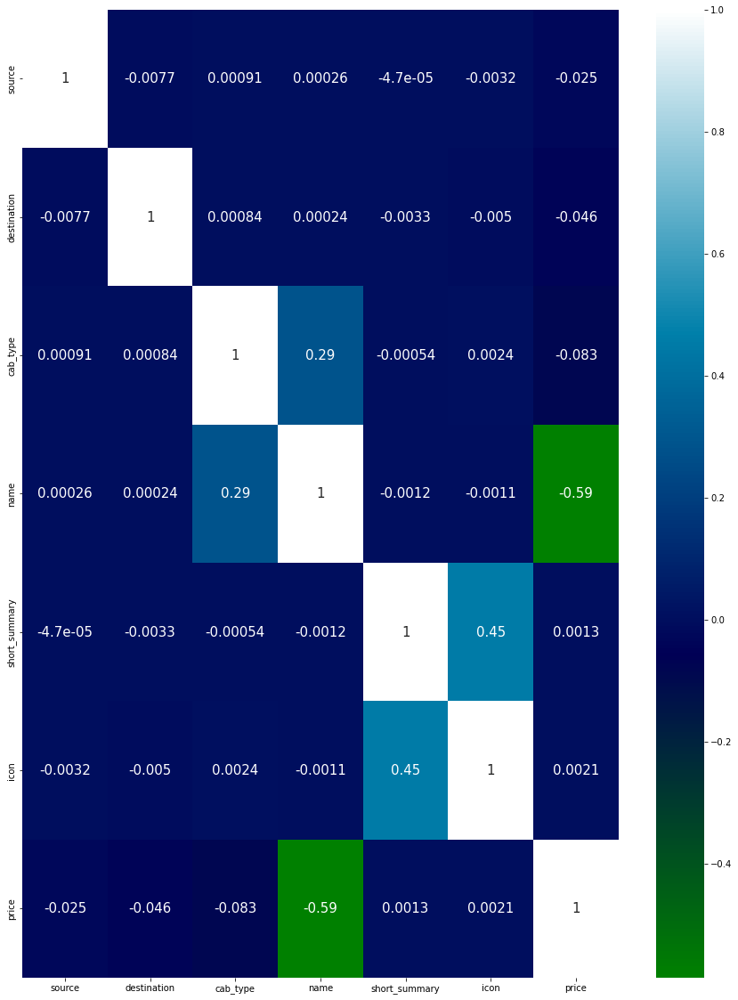

In [51]:
plt.figure(figsize=(15,20))
sns.heatmap(df_korelasi_kolom_3_encode.corr(),annot=True,cmap="ocean", annot_kws={'fontsize': 15})

In [52]:
df_modeling = df_modeling.drop(['source','destination','short_summary','icon'],axis=1)
df_modeling.head()

,hour,day,month,cab_type,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,temperatureHigh,temperatureHighTime,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
0,9,16,12,Lyft,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,0.0000,0.0,0.68,8.66,9.17,10.000,43.68,1544968800,34.19,37.95,27.39,32.70,1021.98,57,0.72,0,303.8,0.30,0.1276,39.89,43.68,33.73,38.07
1,2,27,11,Lyft,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,0.1299,1.0,0.94,11.98,11.98,4.786,47.30,1543251600,42.10,43.92,36.20,41.83,1003.97,90,1.00,0,291.1,0.64,0.1300,40.49,47.30,36.20,43.92
2,1,28,11,Lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,0.0000,0.0,0.75,7.33,7.33,10.000,47.55,1543320000,33.10,44.12,29.11,31.10,992.28,240,0.03,0,315.7,0.68,0.1064,35.36,47.55,31.04,44.12
3,4,30,11,Lyft,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,0.0000,0.0,0.73,5.28,5.28,10.000,45.03,1543510800,28.90,38.53,26.20,26.64,1013.73,310,0.00,0,291.1,0.75,0.0000,34.67,45.03,30.30,38.53
4,3,29,11,Lyft,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,0.0000,0.0,0.70,9.14,9.14,10.000,42.18,1543420800,36.71,35.75,30.29,28.61,998.36,303,0.44,0,347.7,0.72,0.0001,33.10,42.18,29.11,35.75


In [53]:
df_modeling = df_modeling.drop(['hour','day','month','latitude','longitude'],axis=1)
df_modeling.head()

,cab_type,name,price,distance,surge_multiplier,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,temperatureHigh,temperatureHighTime,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
0,Lyft,Shared,5.0,0.44,1.0,42.34,37.12,0.0000,0.0,0.68,8.66,9.17,10.000,43.68,1544968800,34.19,37.95,27.39,32.70,1021.98,57,0.72,0,303.8,0.30,0.1276,39.89,43.68,33.73,38.07
1,Lyft,Lux,11.0,0.44,1.0,43.58,37.35,0.1299,1.0,0.94,11.98,11.98,4.786,47.30,1543251600,42.10,43.92,36.20,41.83,1003.97,90,1.00,0,291.1,0.64,0.1300,40.49,47.30,36.20,43.92
2,Lyft,Lyft,7.0,0.44,1.0,38.33,32.93,0.0000,0.0,0.75,7.33,7.33,10.000,47.55,1543320000,33.10,44.12,29.11,31.10,992.28,240,0.03,0,315.7,0.68,0.1064,35.36,47.55,31.04,44.12
3,Lyft,Lux Black XL,26.0,0.44,1.0,34.38,29.63,0.0000,0.0,0.73,5.28,5.28,10.000,45.03,1543510800,28.90,38.53,26.20,26.64,1013.73,310,0.00,0,291.1,0.75,0.0000,34.67,45.03,30.30,38.53
4,Lyft,Lyft XL,9.0,0.44,1.0,37.44,30.88,0.0000,0.0,0.70,9.14,9.14,10.000,42.18,1543420800,36.71,35.75,30.29,28.61,998.36,303,0.44,0,347.7,0.72,0.0001,33.10,42.18,29.11,35.75


In [54]:
df_modeling.columns

Index(['cab_type', 'name', 'price', 'distance', 'surge_multiplier',
       'temperature', 'apparentTemperature', 'precipIntensity',
       'precipProbability', 'humidity', 'windSpeed', 'windGust', 'visibility',
       'temperatureHigh', 'temperatureHighTime', 'temperatureLow',
       'apparentTemperatureHigh', 'apparentTemperatureLow', 'dewPoint',
       'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'ozone',
       'moonPhase', 'precipIntensityMax', 'temperatureMin', 'temperatureMax',
       'apparentTemperatureMin', 'apparentTemperatureMax'],
      dtype='object')

## Mengecek Outlier dan menghilangkan

In [55]:
Qp12 = df_modeling['price'].quantile(0.25) # Menghitung kuartil 1 (Q1) dari kolom 'price' dalam dataframe df_modeling dan menyimpannya dalam variabel Qp12
Qp32 = df_modeling['price'].quantile(0.75) # Menghitung kuartil 3 (Q3) dari kolom 'price' dalam dataframe df_modeling dan menyimpannya dalam variabel Qp32
IQRp = Qp32-Qp12 # Menghitung rentang antarkuartil (IQR) dari kolom 'price' dalam dataframe df_modeling dan menyimpannya dalam variabel IQRp

In [56]:
df_modeling[df_modeling['price']>(Qp32+(1.5*IQRp))]

,cab_type,name,price,distance,surge_multiplier,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,temperatureHigh,temperatureHighTime,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax
706,Lyft,Lux Black,52.50,3.25,2.00,34.40,29.99,0.0000,0.00,0.78,4.89,7.74,9.899,42.60,1543438800,37.44,36.58,31.97,28.39,991.05,259,0.48,0,344.7,0.72,0.0000,33.75,42.60,29.97,36.58
707,Lyft,Lux Black XL,67.50,3.25,2.00,40.87,37.73,0.0000,0.00,0.70,4.68,5.77,9.827,54.29,1544896800,38.48,53.62,34.85,32.00,1024.46,36,0.14,0,296.6,0.27,0.0082,39.74,54.29,37.04,53.62
769,Lyft,Lux Black XL,45.50,4.76,1.00,44.89,43.20,0.0000,0.00,0.54,3.73,3.73,9.962,46.68,1544814000,40.90,43.98,38.85,29.03,1030.83,167,0.16,1,289.1,0.24,0.0000,26.93,46.68,27.58,43.98
1094,Lyft,Lux Black XL,45.50,4.31,1.00,46.78,43.89,0.0342,1.00,0.96,5.89,8.48,2.030,50.80,1543788000,44.97,50.13,45.62,45.59,1008.80,120,1.00,1,280.3,0.86,0.0916,36.32,50.80,35.84,50.13
1318,Lyft,Lux Black XL,45.50,5.33,1.00,42.42,37.83,0.0036,0.29,0.75,7.41,8.54,9.608,43.78,1544990400,34.12,38.39,28.21,35.13,1018.69,76,1.00,1,326.7,0.30,0.1246,38.94,43.78,33.76,38.39
1321,Lyft,Lux Black XL,45.50,4.50,1.00,53.51,53.51,0.0000,0.00,0.67,2.92,4.30,9.503,54.29,1544896800,39.01,53.62,35.18,42.99,1020.54,313,0.25,1,301.2,0.27,0.0077,39.80,54.29,36.78,53.62
1333,Lyft,Lux Black XL,45.50,0.46,1.75,45.69,45.69,0.0000,0.00,0.95,1.05,1.05,0.717,57.42,1543852800,33.60,56.75,28.23,44.36,1000.79,202,1.00,0,294.4,0.89,0.0004,42.86,57.42,39.73,56.75
1762,Lyft,Lux Black XL,47.50,5.32,1.00,38.54,36.11,0.0308,1.00,0.93,3.53,3.98,4.421,50.94,1543788000,44.88,50.27,45.53,36.81,1019.41,124,1.00,0,271.2,0.86,0.0894,36.40,50.94,35.78,50.27
1936,Lyft,Lux Black XL,45.50,4.35,1.00,37.93,37.93,0.0000,0.00,0.71,2.29,2.92,9.724,44.80,1543690800,34.67,44.13,35.32,29.32,1023.38,124,0.43,0,271.2,0.82,0.0000,31.26,44.80,27.76,44.13
2043,Lyft,Lux Black XL,52.50,2.81,1.50,45.96,43.06,0.0000,0.00,0.61,5.65,8.43,10.000,57.08,1543852800,33.68,56.41,28.12,33.28,1002.29,265,0.14,0,330.8,0.89,0.0004,42.86,57.08,39.54,56.41


In [57]:
df_modeling[df_modeling['price']<(Qp12-(1.5*IQRp))]

,cab_type,name,price,distance,surge_multiplier,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,temperatureHigh,temperatureHighTime,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,temperatureMin,temperatureMax,apparentTemperatureMin,apparentTemperatureMax


In [58]:
print('Size before removing :',df_modeling.shape) # Menampilkan ukuran dataframe df_modeling sebelum penghapusan data
df_modeling= df_modeling[~((df_modeling['price']>(Qp32+(1.5*IQRp))))] # Menghapus baris-baris dalam dataframe df_modeling yang memiliki nilai 'price' yang lebih besar dari batas atas (Q3 + 1.5 * IQR) yang dihitung sebelumnya
print('Size after removing :',df_modeling.shape) # Menampilkan ukuran dataframe df_modeling setelah penghapusan data

Size before removing : (637975, 30)
Size after removing : (632387, 30)


# G. Pendefinisian Model

# H. Pelatihan Model

# I. Evaluasi Model

# J. Model Inference

# H. Pengambilan Kesimpulan